 # SAE Feature Analysis
 Feature heatmaps, firing rate histograms, digit distribution analysis,
 and correlation with attention difference (alpha_diff).

In [ ]:
# SETUP

import os

import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm.auto import tqdm
from torch.utils.data import DataLoader, ConcatDataset

from src.utils.nb_utils import setup_notebook, load_transformer_model, load_sae
from src.data.datasets import get_dataset
from src.sae.activation_collection import collect_sae_activations, collect_attention_patterns, identify_special_features
from src.sae.metrics import compute_reconstruction_metrics, compute_sae_downstream_metrics
from src.sae.visualization import (
    create_firing_rate_histogram,
    create_feature_heatmaps,
    create_feature_heatmaps_seaborn,
    create_alpha_diff_correlation_plot,
)

DEVICE = setup_notebook(seed=42)

SAE_NAME   = "sae_d100_k3_lr0.0003_seed44_2layer_100dig_64d.pt"
# SAE_NAME   = "jumprelu_sae_d128_tl03.0_2layer_100dig_64d.pt"
# SAE_NAME   = "matryoshka_sae_d128_k3_ng4_2layer_100dig_64d.pt"
MODEL_NAME = "2layer_100dig_64d"

model, model_cfg = load_transformer_model(MODEL_NAME, device=DEVICE)
D_MODEL   = model_cfg["d_model"]
LIST_LEN  = model_cfg["list_len"]
N_DIGITS  = model_cfg["n_digits"]
SEP_IDX   = model_cfg["sep_token_index"]

sae, sae_cfg = load_sae(SAE_NAME, D_MODEL, device=DEVICE)
D_SAE    = sae_cfg["dict_size"]
act_mean = sae_cfg["act_mean"].to(DEVICE)

# Full dataset (train + val) for exhaustive activation collection
train_ds, val_ds = get_dataset(n_digits=N_DIGITS, list_len=LIST_LEN, no_dupes=False, train_dupes_only=False)
all_ds  = ConcatDataset([train_ds, val_ds])
all_dl  = DataLoader(all_ds,  batch_size=256, shuffle=False)

val_dl = DataLoader(val_ds, batch_size=256, shuffle=False)

d1_all, d2_all, sae_acts_all = collect_sae_activations(
    model=model, sae=sae, val_dl=all_dl,
    act_mean=act_mean, layer_idx=0, sep_idx=SEP_IDX, device=DEVICE,
)

alpha_d1_all, alpha_d2_all = collect_attention_patterns(
    model=model, val_dl=all_dl,
    layer_idx=0, sep_idx=SEP_IDX, device=DEVICE, use_scores=True,
)

Using device: cpu
Parsed model config (old format): 2 layers, 100 digits, 64 d_model, list_len=2
Loading model from /home2/nchw73/Year4/L4_Project/list-comp-priv/models/2layer_100dig_64d.pt
Moving model to device:  cpu
✓ Loaded model from /home2/nchw73/Year4/L4_Project/list-comp-priv/models/2layer_100dig_64d.pt
✓ Loaded btk SAE from /home2/nchw73/Year4/L4_Project/list-comp-priv/results/sae_models/sae_d100_k3_lr0.0003_seed44_2layer_100dig_64d.pt
  - Dictionary size: 100


 ## Cell 0 — SAE summary metrics

In [ ]:
firing_freq = (sae_acts_all > 0).float().mean(dim=0).numpy()
n_dead      = int((sae_acts_all.sum(dim=0) == 0).sum().item())
l0          = float((sae_acts_all > 0).float().sum(dim=1).mean())

# Explained variance
recon_metrics = compute_reconstruction_metrics(
        model=model, sae=sae, val_dl=val_dl,
        act_mean=act_mean, layer_idx=0, sep_idx=SEP_IDX, device=DEVICE,
    )

downstream = compute_sae_downstream_metrics(
    model=model, sae=sae, val_dl=val_dl,
    act_mean=act_mean, layer_idx=0, sep_idx=SEP_IDX, device=DEVICE,
)

special_info = identify_special_features(sae_acts_all, alpha_d1_all, alpha_d2_all, threshold=0.5)

print(f"SAE: {SAE_NAME}")
print(f"{'─'*60}")
print(f"  d_sae:        {D_SAE}")
print(f"  k:            {sae_cfg.get('k', '?')}")
print(f"  L0:           {l0:.2f}")
print(f"  Dead %:       {100 * n_dead / D_SAE:.1f}%  ({n_dead}/{D_SAE})")
print(f"  Exp Var:      {recon_metrics['explained_variance']:.4f}")
print(f"  Baseline CE:  {downstream['baseline_ce']:.4f}")
print(f"  Patched CE:   {downstream['patched_ce']:.4f}")
print(f"  CE Increase:  {downstream['ce_increase']:.4f}")
print(f"  N Special:    {special_info['n_special_features']}")
print(f"{'─'*60}")

SAE: sae_d100_k3_lr0.0003_seed44_2layer_100dig_64d.pt
────────────────────────────────────────────────────────────
  d_sae:        100
  k:            3
  L0:           3.02
  Dead %:       0.0%  (0/100)
  Exp Var:      0.9763
  Baseline CE:  0.1808
  Patched CE:   0.4850
  CE Increase:  0.3043
  N Special:    1
────────────────────────────────────────────────────────────


 ## Cell 1 — Firing rate histogram (seaborn)

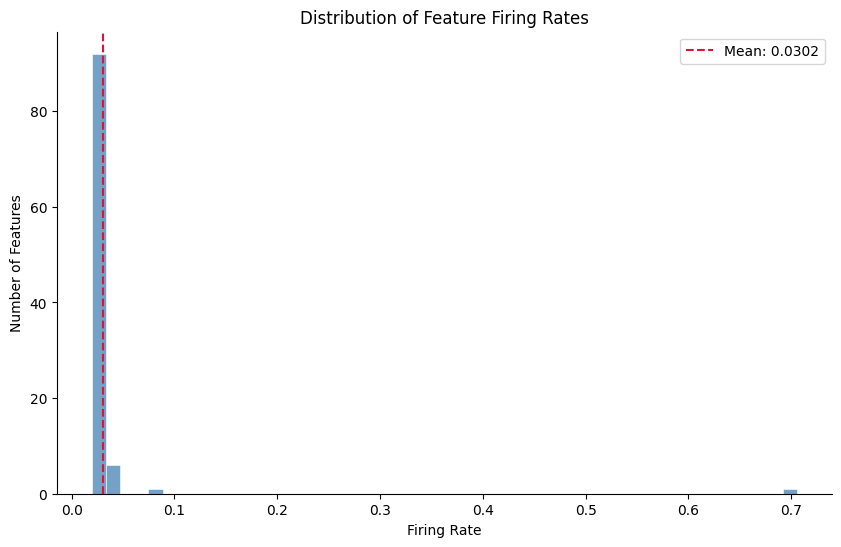

In [ ]:
fig = create_firing_rate_histogram(sae_acts_all)
plt.show()

 ## Cell 2 — Digit distribution for top features

Computing digit stats: 100%|██████████| 20/20 [00:00<00:00, 228.91it/s]


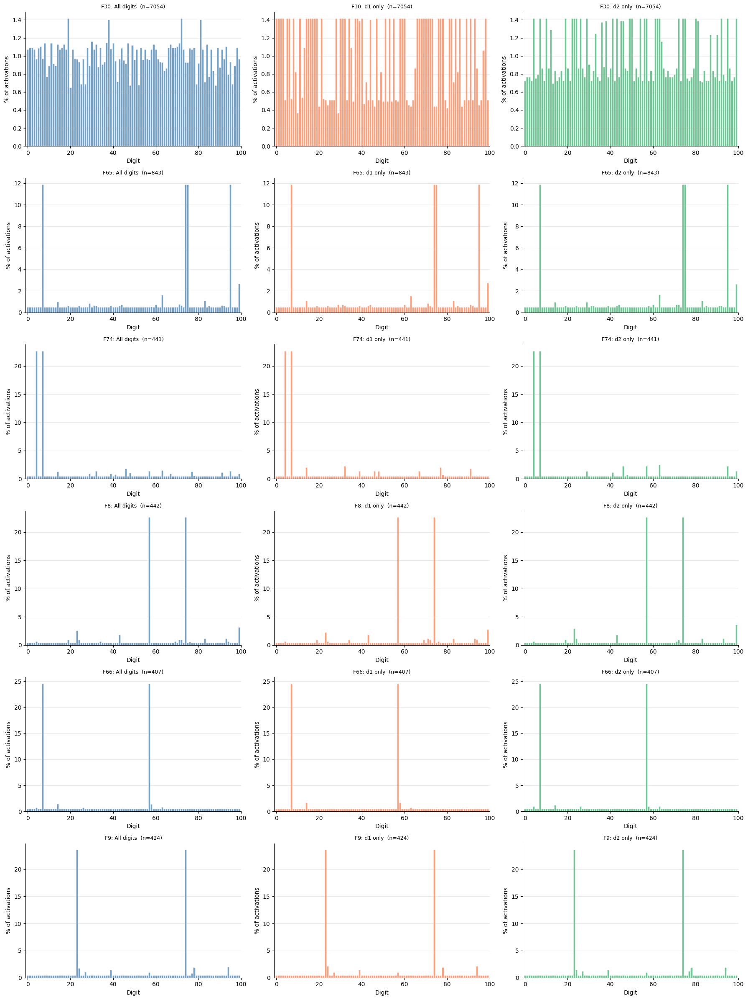

In [ ]:
def compute_feature_digit_stats(feat_idx, d1_all, d2_all, sae_acts_all, n_digits):
    active_mask = sae_acts_all[:, feat_idx] > 0
    n_inputs = active_mask.sum().item()
    if n_inputs == 0:
        zeros = np.zeros(n_digits)
        return {"n_inputs": 0, "all_digit_dist": zeros, "d1_digit_dist": zeros, "d2_digit_dist": zeros}

    d1_active = d1_all[active_mask].numpy()
    d2_active = d2_all[active_mask].numpy()
    d1_counts = np.bincount(d1_active, minlength=n_digits)
    d2_counts = np.bincount(d2_active, minlength=n_digits)
    return {
        "n_inputs": n_inputs,
        "all_digit_dist": 100 * (d1_counts + d2_counts) / (2 * n_inputs),
        "d1_digit_dist":  100 * d1_counts / n_inputs,
        "d2_digit_dist":  100 * d2_counts / n_inputs,
    }


# Sort features by total activation; analyse top-N
firing_freq  = (sae_acts_all > 0).float().mean(dim=0).numpy()
total_act    = sae_acts_all.sum(dim=0).numpy()
top_features = np.argsort(total_act)[::-1][:20].tolist()

feature_stats = {
    fi: compute_feature_digit_stats(fi, d1_all, d2_all, sae_acts_all, N_DIGITS)
    for fi in tqdm(top_features, desc="Computing digit stats")
}

# --- Visualize: grid of (all | d1 | d2) bar charts for top features ---
n_vis  = min(6, len(top_features))
digits = np.arange(N_DIGITS)

fig, axes = plt.subplots(n_vis, 3, figsize=(18, 4 * n_vis))
if n_vis == 1:
    axes = axes[np.newaxis, :]

col_colours = ["steelblue", "coral", "mediumseagreen"]
col_labels  = ["All digits", "d1 only", "d2 only"]
dist_keys   = ["all_digit_dist", "d1_digit_dist", "d2_digit_dist"]

for idx, fi in enumerate(top_features[:n_vis]):
    stats = feature_stats[fi]
    for c, (key, colour, label) in enumerate(zip(dist_keys, col_colours, col_labels)):
        ax = axes[idx, c]
        ax.bar(digits, stats[key], color=colour, alpha=0.75, edgecolor="white", linewidth=0.4)
        ax.set_xlim(-1, N_DIGITS)
        ax.set_title(f"F{fi}: {label}  (n={stats['n_inputs']})", fontsize=9)
        ax.set_xlabel("Digit")
        ax.set_ylabel("% of activations")
        ax.grid(alpha=0.3, axis="y")
        sns.despine(ax=ax)

plt.tight_layout()
plt.show()

 ## Cell 3 — Full feature heatmap (Plotly interactive)

In [ ]:
fig = create_feature_heatmaps(d1_all, d2_all, sae_acts_all, n_digits=N_DIGITS, figsize=(25, 25))
fig.show()

 ## Cell 4 — Selected feature heatmaps (seaborn, ~3 types)
 There are roughly three heatmap archetypes:
   - tba

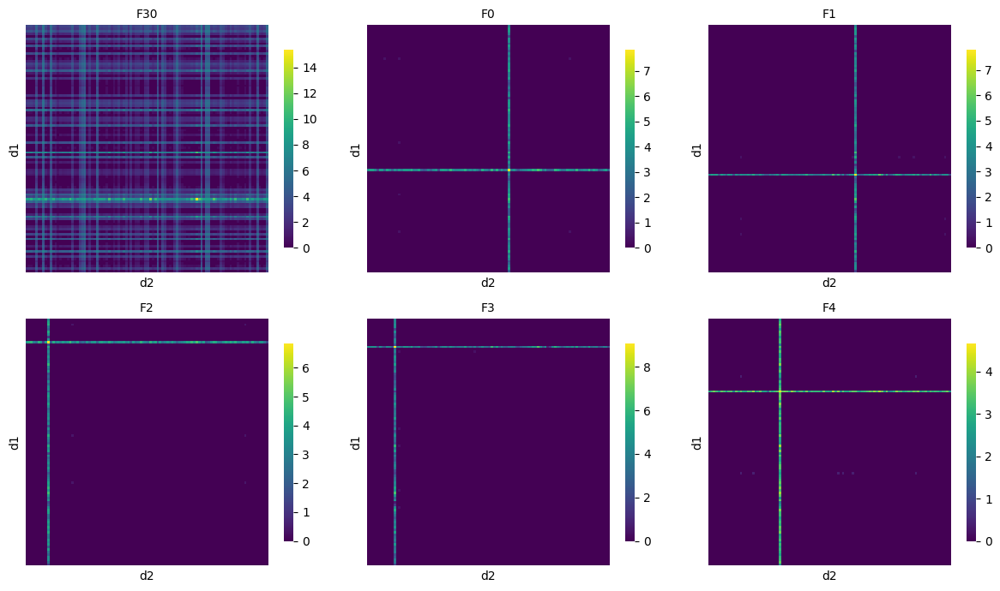

In [ ]:
# Edit this list to compare features of interest
FEATURES_TO_PLOT = [30, 0, 1, 2, 3, 4]

fig = create_feature_heatmaps_seaborn(
    d1_all, d2_all, sae_acts_all,
    feature_indices=FEATURES_TO_PLOT,
    n_digits=N_DIGITS,
    ncols=3,
)
plt.show()

 ## Cell 5 — Alpha-diff correlation analysis

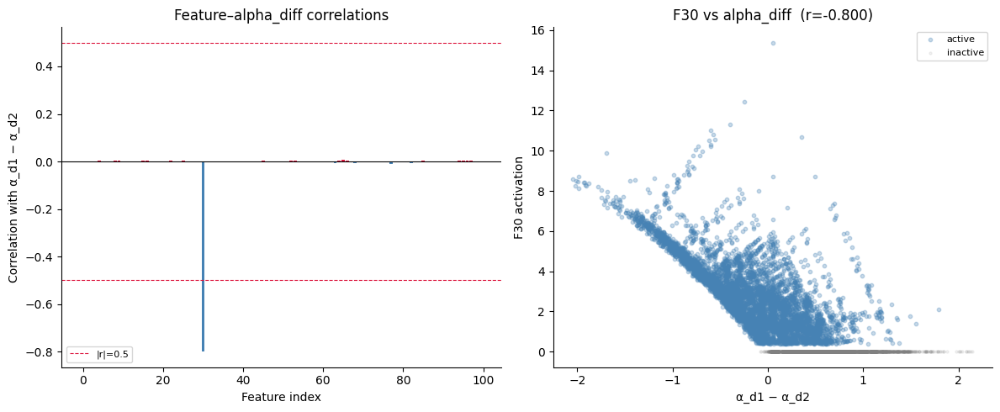


Special features (|r| > 0.5): 1
 Feature  Correlation        Type  Fire_Rate_%  N_Active
      30      -0.7996 d2_favoring        70.54      7054


In [ ]:
fig, correlations = create_alpha_diff_correlation_plot(
    sae_acts_all, alpha_d1_all, alpha_d2_all,
)
plt.show()

# --- Summary table (reuse special_info from cell 0) ---
info = special_info

rows = []
for feat_info in sorted(info["special_features"], key=lambda x: abs(x["correlation"]), reverse=True):
    fi = feat_info["feature_idx"]
    rows.append({
        "Feature": fi,
        "Correlation": round(feat_info["correlation"], 4),
        "Type": feat_info["type"],
        "Fire_Rate_%": round(float(firing_freq[fi]) * 100, 2),
        "N_Active": feature_stats[fi]["n_inputs"] if fi in feature_stats else "—",
    })

df_special = pd.DataFrame(rows)
print(f"\nSpecial features (|r| > 0.5): {info['n_special_features']}")
print(df_special.to_string(index=False))

 # SAE Feature Analysis
 Feature heatmaps, firing rate histograms, digit distribution analysis,
 and correlation with attention difference (alpha_diff).

In [ ]:
# SETUP

import os

import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm.auto import tqdm
from torch.utils.data import DataLoader, ConcatDataset

from src.utils.nb_utils import setup_notebook, load_transformer_model, load_sae
from src.data.datasets import get_dataset
from src.sae.activation_collection import collect_sae_activations, collect_attention_patterns, identify_special_features
from src.sae.metrics import compute_reconstruction_metrics, compute_sae_downstream_metrics
from src.sae.visualization import (
    create_firing_rate_histogram,
    create_feature_heatmaps,
    create_feature_heatmaps_seaborn,
    create_alpha_diff_correlation_plot,
)

DEVICE = setup_notebook(seed=42)

# SAE_NAME   = "sae_d100_k3_lr0.0003_seed44_2layer_100dig_64d.pt"
SAE_NAME   = "jumprelu_sae_d128_tl03.0_2layer_100dig_64d.pt"
# SAE_NAME   = "matryoshka_sae_d128_k3_ng4_2layer_100dig_64d.pt"
MODEL_NAME = "2layer_100dig_64d"

model, model_cfg = load_transformer_model(MODEL_NAME, device=DEVICE)
D_MODEL   = model_cfg["d_model"]
LIST_LEN  = model_cfg["list_len"]
N_DIGITS  = model_cfg["n_digits"]
SEP_IDX   = model_cfg["sep_token_index"]

sae, sae_cfg = load_sae(SAE_NAME, D_MODEL, device=DEVICE)
D_SAE    = sae_cfg["dict_size"]
act_mean = sae_cfg["act_mean"].to(DEVICE)

# Full dataset (train + val) for exhaustive activation collection
train_ds, val_ds = get_dataset(n_digits=N_DIGITS, list_len=LIST_LEN, no_dupes=False, train_dupes_only=False)
all_ds  = ConcatDataset([train_ds, val_ds])
all_dl  = DataLoader(all_ds,  batch_size=256, shuffle=False)

val_dl = DataLoader(val_ds, batch_size=256, shuffle=False)

d1_all, d2_all, sae_acts_all = collect_sae_activations(
    model=model, sae=sae, val_dl=all_dl,
    act_mean=act_mean, layer_idx=0, sep_idx=SEP_IDX, device=DEVICE,
)

alpha_d1_all, alpha_d2_all = collect_attention_patterns(
    model=model, val_dl=all_dl,
    layer_idx=0, sep_idx=SEP_IDX, device=DEVICE, use_scores=True,
)

Using device: cpu
Parsed model config (old format): 2 layers, 100 digits, 64 d_model, list_len=2
Loading model from /home2/nchw73/Year4/L4_Project/list-comp-priv/models/2layer_100dig_64d.pt
Moving model to device:  cpu
✓ Loaded model from /home2/nchw73/Year4/L4_Project/list-comp-priv/models/2layer_100dig_64d.pt
✓ Loaded jumprelu SAE from /home2/nchw73/Year4/L4_Project/list-comp-priv/results/sae_models/jumprelu_sae_d128_tl03.0_2layer_100dig_64d.pt
  - Dictionary size: 128


 ## Cell 0 — SAE summary metrics

In [ ]:
firing_freq = (sae_acts_all > 0).float().mean(dim=0).numpy()
n_dead      = int((sae_acts_all.sum(dim=0) == 0).sum().item())
l0          = float((sae_acts_all > 0).float().sum(dim=1).mean())

# Explained variance
recon_metrics = compute_reconstruction_metrics(
        model=model, sae=sae, val_dl=val_dl,
        act_mean=act_mean, layer_idx=0, sep_idx=SEP_IDX, device=DEVICE,
    )

downstream = compute_sae_downstream_metrics(
    model=model, sae=sae, val_dl=val_dl,
    act_mean=act_mean, layer_idx=0, sep_idx=SEP_IDX, device=DEVICE,
)

special_info = identify_special_features(sae_acts_all, alpha_d1_all, alpha_d2_all, threshold=0.5)

print(f"SAE: {SAE_NAME}")
print(f"{'─'*60}")
print(f"  d_sae:        {D_SAE}")
print(f"  k:            {sae_cfg.get('k', '?')}")
print(f"  L0:           {l0:.2f}")
print(f"  Dead %:       {100 * n_dead / D_SAE:.1f}%  ({n_dead}/{D_SAE})")
print(f"  Exp Var:      {recon_metrics['explained_variance']:.4f}")
print(f"  Baseline CE:  {downstream['baseline_ce']:.4f}")
print(f"  Patched CE:   {downstream['patched_ce']:.4f}")
print(f"  CE Increase:  {downstream['ce_increase']:.4f}")
print(f"  N Special:    {special_info['n_special_features']}")
print(f"{'─'*60}")

SAE: jumprelu_sae_d128_tl03.0_2layer_100dig_64d.pt
────────────────────────────────────────────────────────────
  d_sae:        128
  k:            ?
  L0:           3.61
  Dead %:       1.6%  (2/128)
  Exp Var:      0.9857
  Baseline CE:  0.1808
  Patched CE:   0.3522
  CE Increase:  0.1714
  N Special:    2
────────────────────────────────────────────────────────────


 ## Cell 1 — Firing rate histogram (seaborn)

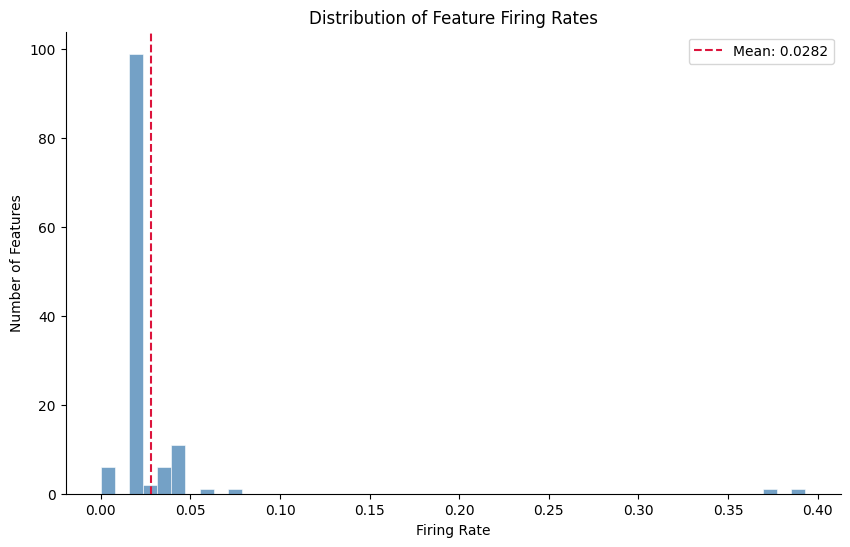

In [ ]:
fig = create_firing_rate_histogram(sae_acts_all)
plt.show()

 ## Cell 2 — Digit distribution for top features

Computing digit stats: 100%|██████████| 20/20 [00:00<00:00, 1872.96it/s]


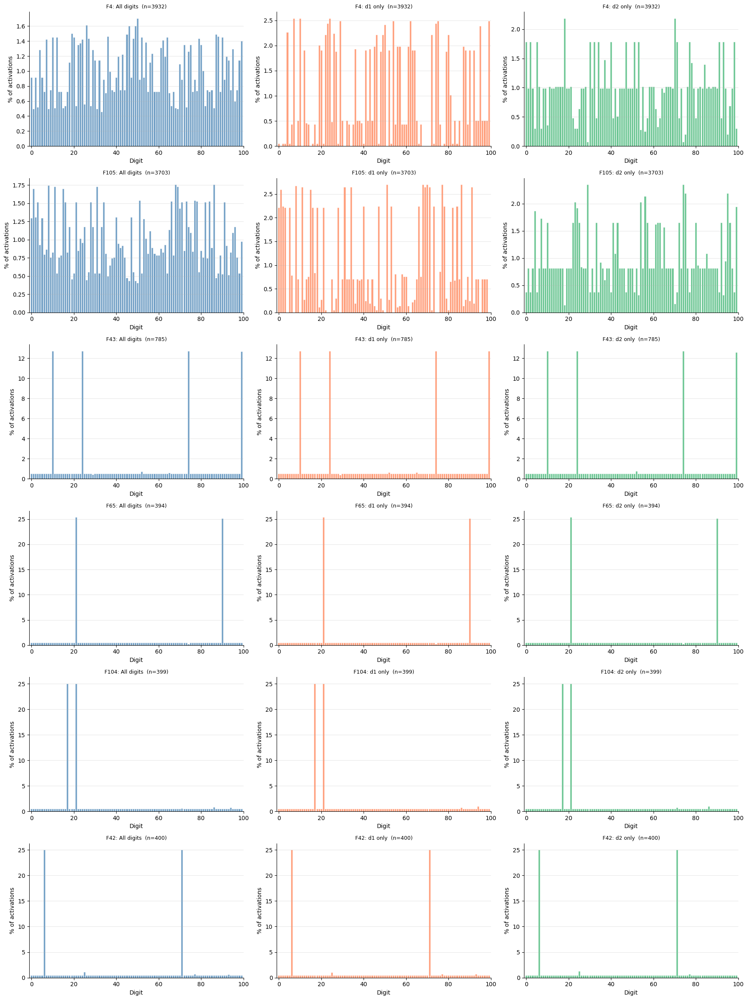

In [ ]:
def compute_feature_digit_stats(feat_idx, d1_all, d2_all, sae_acts_all, n_digits):
    active_mask = sae_acts_all[:, feat_idx] > 0
    n_inputs = active_mask.sum().item()
    if n_inputs == 0:
        zeros = np.zeros(n_digits)
        return {"n_inputs": 0, "all_digit_dist": zeros, "d1_digit_dist": zeros, "d2_digit_dist": zeros}

    d1_active = d1_all[active_mask].numpy()
    d2_active = d2_all[active_mask].numpy()
    d1_counts = np.bincount(d1_active, minlength=n_digits)
    d2_counts = np.bincount(d2_active, minlength=n_digits)
    return {
        "n_inputs": n_inputs,
        "all_digit_dist": 100 * (d1_counts + d2_counts) / (2 * n_inputs),
        "d1_digit_dist":  100 * d1_counts / n_inputs,
        "d2_digit_dist":  100 * d2_counts / n_inputs,
    }


# Sort features by total activation; analyse top-N
firing_freq  = (sae_acts_all > 0).float().mean(dim=0).numpy()
total_act    = sae_acts_all.sum(dim=0).numpy()
top_features = np.argsort(total_act)[::-1][:20].tolist()

feature_stats = {
    fi: compute_feature_digit_stats(fi, d1_all, d2_all, sae_acts_all, N_DIGITS)
    for fi in tqdm(top_features, desc="Computing digit stats")
}

# --- Visualize: grid of (all | d1 | d2) bar charts for top features ---
n_vis  = min(6, len(top_features))
digits = np.arange(N_DIGITS)

fig, axes = plt.subplots(n_vis, 3, figsize=(18, 4 * n_vis))
if n_vis == 1:
    axes = axes[np.newaxis, :]

col_colours = ["steelblue", "coral", "mediumseagreen"]
col_labels  = ["All digits", "d1 only", "d2 only"]
dist_keys   = ["all_digit_dist", "d1_digit_dist", "d2_digit_dist"]

for idx, fi in enumerate(top_features[:n_vis]):
    stats = feature_stats[fi]
    for c, (key, colour, label) in enumerate(zip(dist_keys, col_colours, col_labels)):
        ax = axes[idx, c]
        ax.bar(digits, stats[key], color=colour, alpha=0.75, edgecolor="white", linewidth=0.4)
        ax.set_xlim(-1, N_DIGITS)
        ax.set_title(f"F{fi}: {label}  (n={stats['n_inputs']})", fontsize=9)
        ax.set_xlabel("Digit")
        ax.set_ylabel("% of activations")
        ax.grid(alpha=0.3, axis="y")
        sns.despine(ax=ax)

plt.tight_layout()
plt.show()

 ## Cell 3 — Full feature heatmap (Plotly interactive)

In [ ]:
fig = create_feature_heatmaps(d1_all, d2_all, sae_acts_all, n_digits=N_DIGITS, figsize=(25, 25))
fig.show()

 ## Cell 4 — Selected feature heatmaps (seaborn, ~3 types)
 There are roughly three heatmap archetypes:
   - tba

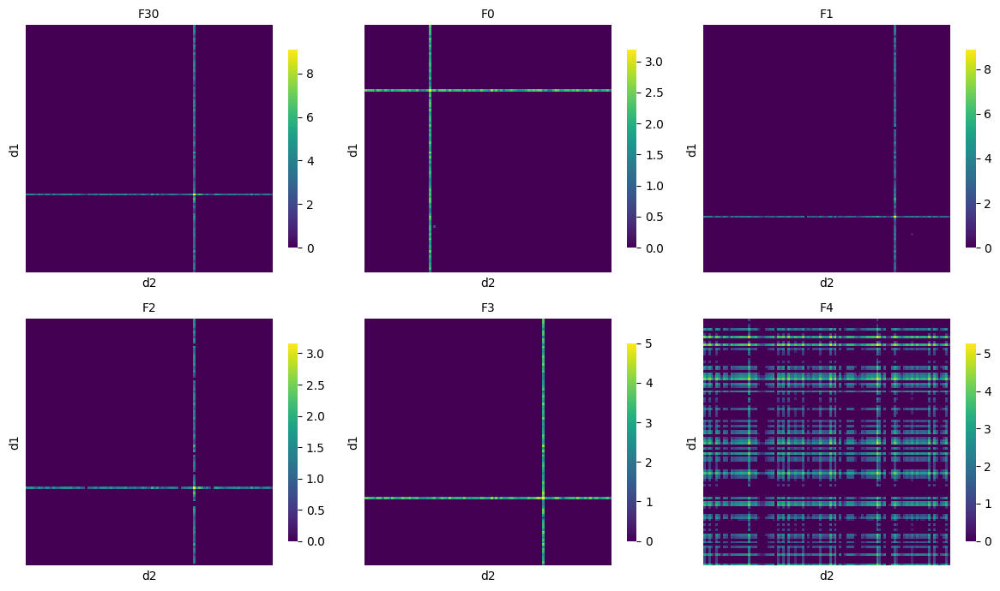

In [ ]:
# Edit this list to compare features of interest
FEATURES_TO_PLOT = [30, 0, 1, 2, 3, 4]

fig = create_feature_heatmaps_seaborn(
    d1_all, d2_all, sae_acts_all,
    feature_indices=FEATURES_TO_PLOT,
    n_digits=N_DIGITS,
    ncols=3,
)
plt.show()

 ## Cell 5 — Alpha-diff correlation analysis

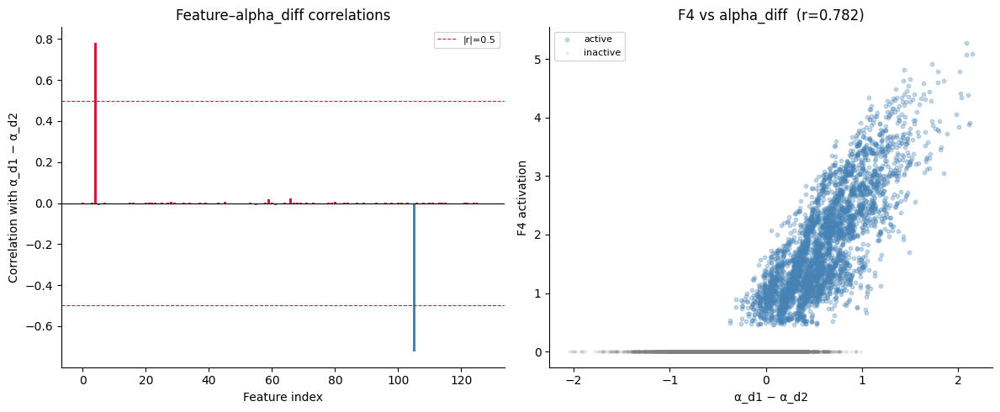


Special features (|r| > 0.5): 2
 Feature  Correlation        Type  Fire_Rate_%  N_Active
       4       0.7824 d1_favoring        39.32      3932
     105      -0.7243 d2_favoring        37.03      3703


In [ ]:
fig, correlations = create_alpha_diff_correlation_plot(
    sae_acts_all, alpha_d1_all, alpha_d2_all,
)
plt.show()

# --- Summary table (reuse special_info from cell 0) ---
info = special_info

rows = []
for feat_info in sorted(info["special_features"], key=lambda x: abs(x["correlation"]), reverse=True):
    fi = feat_info["feature_idx"]
    rows.append({
        "Feature": fi,
        "Correlation": round(feat_info["correlation"], 4),
        "Type": feat_info["type"],
        "Fire_Rate_%": round(float(firing_freq[fi]) * 100, 2),
        "N_Active": feature_stats[fi]["n_inputs"] if fi in feature_stats else "—",
    })

df_special = pd.DataFrame(rows)
print(f"\nSpecial features (|r| > 0.5): {info['n_special_features']}")
print(df_special.to_string(index=False))

 # SAE Feature Analysis
 Feature heatmaps, firing rate histograms, digit distribution analysis,
 and correlation with attention difference (alpha_diff).

In [ ]:
# SETUP

import os

import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from tqdm.auto import tqdm
from torch.utils.data import DataLoader, ConcatDataset

from src.utils.nb_utils import setup_notebook, load_transformer_model, load_sae
from src.data.datasets import get_dataset
from src.sae.activation_collection import collect_sae_activations, collect_attention_patterns, identify_special_features
from src.sae.metrics import compute_reconstruction_metrics, compute_sae_downstream_metrics
from src.sae.visualization import (
    create_firing_rate_histogram,
    create_feature_heatmaps,
    create_feature_heatmaps_seaborn,
    create_alpha_diff_correlation_plot,
)

DEVICE = setup_notebook(seed=42)

# SAE_NAME   = "sae_d100_k3_lr0.0003_seed44_2layer_100dig_64d.pt"
# SAE_NAME   = "jumprelu_sae_d128_tl03.0_2layer_100dig_64d.pt"
SAE_NAME   = "matryoshka_sae_d128_k3_ng4_2layer_100dig_64d.pt"
MODEL_NAME = "2layer_100dig_64d"

model, model_cfg = load_transformer_model(MODEL_NAME, device=DEVICE)
D_MODEL   = model_cfg["d_model"]
LIST_LEN  = model_cfg["list_len"]
N_DIGITS  = model_cfg["n_digits"]
SEP_IDX   = model_cfg["sep_token_index"]

sae, sae_cfg = load_sae(SAE_NAME, D_MODEL, device=DEVICE)
D_SAE    = sae_cfg["dict_size"]
act_mean = sae_cfg["act_mean"].to(DEVICE)

# Full dataset (train + val) for exhaustive activation collection
train_ds, val_ds = get_dataset(n_digits=N_DIGITS, list_len=LIST_LEN, no_dupes=False, train_dupes_only=False)
all_ds  = ConcatDataset([train_ds, val_ds])
all_dl  = DataLoader(all_ds,  batch_size=256, shuffle=False)

val_dl = DataLoader(val_ds, batch_size=256, shuffle=False)

d1_all, d2_all, sae_acts_all = collect_sae_activations(
    model=model, sae=sae, val_dl=all_dl,
    act_mean=act_mean, layer_idx=0, sep_idx=SEP_IDX, device=DEVICE,
)

alpha_d1_all, alpha_d2_all = collect_attention_patterns(
    model=model, val_dl=all_dl,
    layer_idx=0, sep_idx=SEP_IDX, device=DEVICE, use_scores=True,
)

Using device: cpu
Parsed model config (old format): 2 layers, 100 digits, 64 d_model, list_len=2
Loading model from /home2/nchw73/Year4/L4_Project/list-comp-priv/models/2layer_100dig_64d.pt
Moving model to device:  cpu
✓ Loaded model from /home2/nchw73/Year4/L4_Project/list-comp-priv/models/2layer_100dig_64d.pt
✓ Loaded matryoshka SAE from /home2/nchw73/Year4/L4_Project/list-comp-priv/results/sae_models/matryoshka_sae_d128_k3_ng4_2layer_100dig_64d.pt
  - Dictionary size: 128


 ## Cell 0 — SAE summary metrics

In [ ]:
firing_freq = (sae_acts_all > 0).float().mean(dim=0).numpy()
n_dead      = int((sae_acts_all.sum(dim=0) == 0).sum().item())
l0          = float((sae_acts_all > 0).float().sum(dim=1).mean())

# Explained variance
recon_metrics = compute_reconstruction_metrics(
        model=model, sae=sae, val_dl=val_dl,
        act_mean=act_mean, layer_idx=0, sep_idx=SEP_IDX, device=DEVICE,
    )

downstream = compute_sae_downstream_metrics(
    model=model, sae=sae, val_dl=val_dl,
    act_mean=act_mean, layer_idx=0, sep_idx=SEP_IDX, device=DEVICE,
)

special_info = identify_special_features(sae_acts_all, alpha_d1_all, alpha_d2_all, threshold=0.5)

print(f"SAE: {SAE_NAME}")
print(f"{'─'*60}")
print(f"  d_sae:        {D_SAE}")
print(f"  k:            {sae_cfg.get('k', '?')}")
print(f"  L0:           {l0:.2f}")
print(f"  Dead %:       {100 * n_dead / D_SAE:.1f}%  ({n_dead}/{D_SAE})")
print(f"  Exp Var:      {recon_metrics['explained_variance']:.4f}")
print(f"  Baseline CE:  {downstream['baseline_ce']:.4f}")
print(f"  Patched CE:   {downstream['patched_ce']:.4f}")
print(f"  CE Increase:  {downstream['ce_increase']:.4f}")
print(f"  N Special:    {special_info['n_special_features']}")
print(f"{'─'*60}")

SAE: matryoshka_sae_d128_k3_ng4_2layer_100dig_64d.pt
────────────────────────────────────────────────────────────
  d_sae:        128
  k:            3
  L0:           2.97
  Dead %:       14.1%  (18/128)
  Exp Var:      0.9821
  Baseline CE:  0.1808
  Patched CE:   0.4663
  CE Increase:  0.2855
  N Special:    1
────────────────────────────────────────────────────────────


 ## Cell 1 — Firing rate histogram (seaborn)

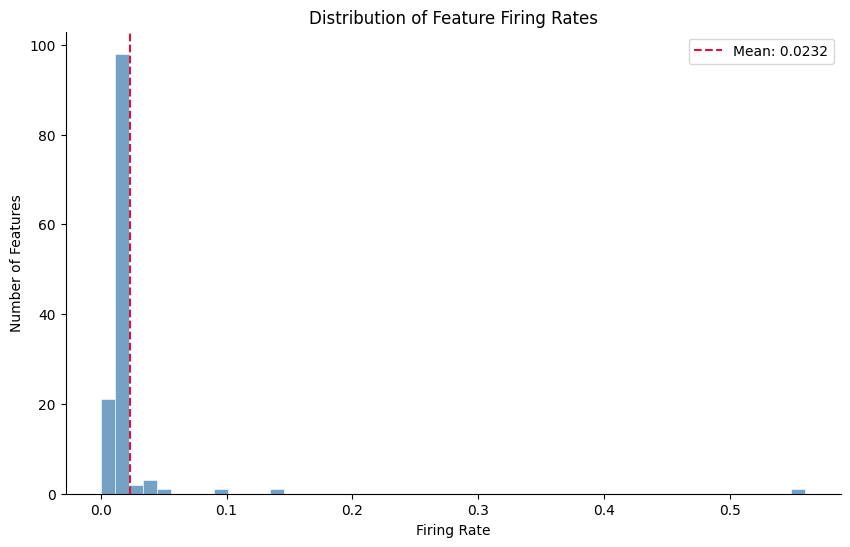

In [ ]:
fig = create_firing_rate_histogram(sae_acts_all)
plt.show()

 ## Cell 2 — Digit distribution for top features

Computing digit stats: 100%|██████████| 20/20 [00:00<00:00, 211.10it/s]


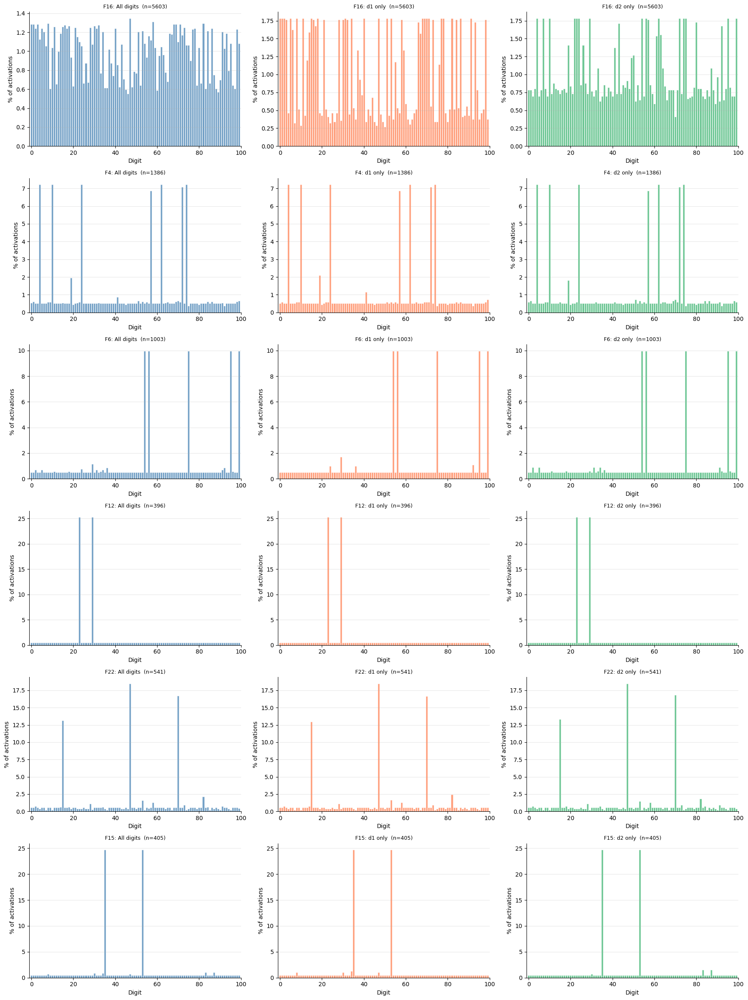

In [ ]:
def compute_feature_digit_stats(feat_idx, d1_all, d2_all, sae_acts_all, n_digits):
    active_mask = sae_acts_all[:, feat_idx] > 0
    n_inputs = active_mask.sum().item()
    if n_inputs == 0:
        zeros = np.zeros(n_digits)
        return {"n_inputs": 0, "all_digit_dist": zeros, "d1_digit_dist": zeros, "d2_digit_dist": zeros}

    d1_active = d1_all[active_mask].numpy()
    d2_active = d2_all[active_mask].numpy()
    d1_counts = np.bincount(d1_active, minlength=n_digits)
    d2_counts = np.bincount(d2_active, minlength=n_digits)
    return {
        "n_inputs": n_inputs,
        "all_digit_dist": 100 * (d1_counts + d2_counts) / (2 * n_inputs),
        "d1_digit_dist":  100 * d1_counts / n_inputs,
        "d2_digit_dist":  100 * d2_counts / n_inputs,
    }


# Sort features by total activation; analyse top-N
firing_freq  = (sae_acts_all > 0).float().mean(dim=0).numpy()
total_act    = sae_acts_all.sum(dim=0).numpy()
top_features = np.argsort(total_act)[::-1][:20].tolist()

feature_stats = {
    fi: compute_feature_digit_stats(fi, d1_all, d2_all, sae_acts_all, N_DIGITS)
    for fi in tqdm(top_features, desc="Computing digit stats")
}

# --- Visualize: grid of (all | d1 | d2) bar charts for top features ---
n_vis  = min(6, len(top_features))
digits = np.arange(N_DIGITS)

fig, axes = plt.subplots(n_vis, 3, figsize=(18, 4 * n_vis))
if n_vis == 1:
    axes = axes[np.newaxis, :]

col_colours = ["steelblue", "coral", "mediumseagreen"]
col_labels  = ["All digits", "d1 only", "d2 only"]
dist_keys   = ["all_digit_dist", "d1_digit_dist", "d2_digit_dist"]

for idx, fi in enumerate(top_features[:n_vis]):
    stats = feature_stats[fi]
    for c, (key, colour, label) in enumerate(zip(dist_keys, col_colours, col_labels)):
        ax = axes[idx, c]
        ax.bar(digits, stats[key], color=colour, alpha=0.75, edgecolor="white", linewidth=0.4)
        ax.set_xlim(-1, N_DIGITS)
        ax.set_title(f"F{fi}: {label}  (n={stats['n_inputs']})", fontsize=9)
        ax.set_xlabel("Digit")
        ax.set_ylabel("% of activations")
        ax.grid(alpha=0.3, axis="y")
        sns.despine(ax=ax)

plt.tight_layout()
plt.show()

 ## Cell 3 — Full feature heatmap (Plotly interactive)

In [ ]:
fig = create_feature_heatmaps(d1_all, d2_all, sae_acts_all, n_digits=N_DIGITS, figsize=(25, 25))
fig.show()

 ## Cell 4 — Selected feature heatmaps (seaborn, ~3 types)
 There are roughly three heatmap archetypes:
   - tba

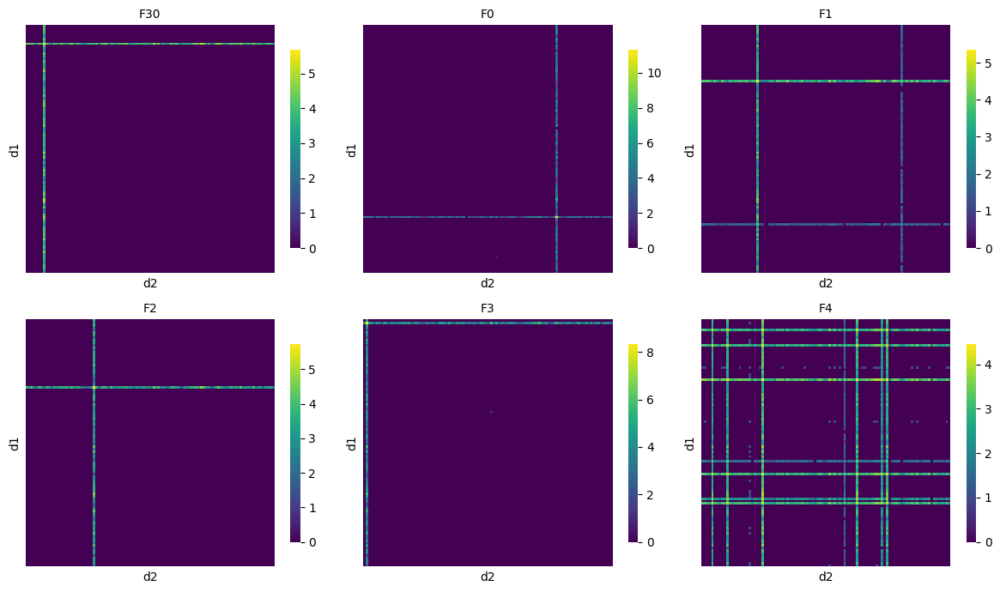

In [ ]:
# Edit this list to compare features of interest
FEATURES_TO_PLOT = [30, 0, 1, 2, 3, 4]

fig = create_feature_heatmaps_seaborn(
    d1_all, d2_all, sae_acts_all,
    feature_indices=FEATURES_TO_PLOT,
    n_digits=N_DIGITS,
    ncols=3,
)
plt.show()

 ## Cell 5 — Alpha-diff correlation analysis

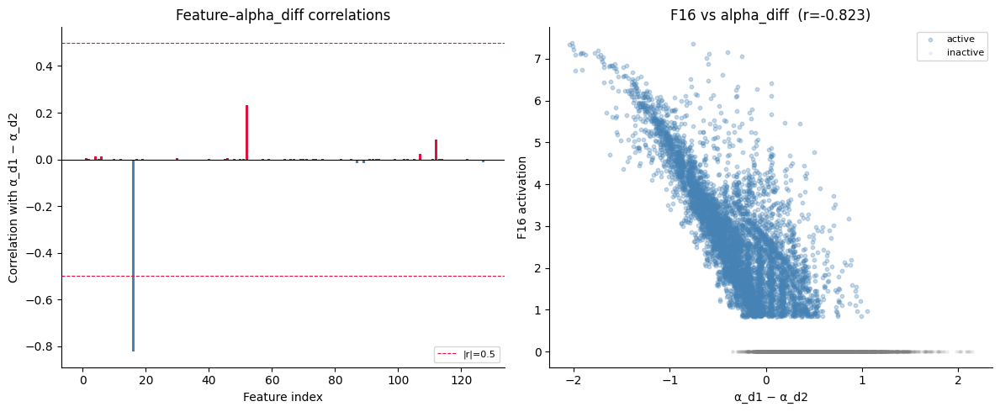


Special features (|r| > 0.5): 1
 Feature  Correlation        Type  Fire_Rate_%  N_Active
      16      -0.8231 d2_favoring        56.03      5603


In [ ]:
fig, correlations = create_alpha_diff_correlation_plot(
    sae_acts_all, alpha_d1_all, alpha_d2_all,
)
plt.show()

# --- Summary table (reuse special_info from cell 0) ---
info = special_info

rows = []
for feat_info in sorted(info["special_features"], key=lambda x: abs(x["correlation"]), reverse=True):
    fi = feat_info["feature_idx"]
    rows.append({
        "Feature": fi,
        "Correlation": round(feat_info["correlation"], 4),
        "Type": feat_info["type"],
        "Fire_Rate_%": round(float(firing_freq[fi]) * 100, 2),
        "N_Active": feature_stats[fi]["n_inputs"] if fi in feature_stats else "—",
    })

df_special = pd.DataFrame(rows)
print(f"\nSpecial features (|r| > 0.5): {info['n_special_features']}")
print(df_special.to_string(index=False))